In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [21]:
import os
if os.path.isdir('/content/gdrive'):
    print("Google Drive mounted successfully.")
else:
    print("Failed to mount Google Drive.")


Google Drive mounted successfully.


In [23]:
# Importing computational packages
import numpy as np
import pandas as pd
pd.set_option("display.max_columns", 100)

# Importing visualization packages
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Importing model building packages
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier


from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import f1_score, classification_report

import warnings
warnings.filterwarnings("ignore")


Reading and Understanding the Data


In [24]:
#To read csv File from google drive
file_path = '/content/gdrive/MyDrive/archive/fraudTrain.csv'


In [25]:
#Read the CSV file using pandas
df = pd.read_csv(file_path)
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [26]:
# Examining the dataset imported:
df.shape

(1296675, 23)

In [27]:
# Lets check the numeric distribution of the data:
df.describe()

,Unnamed: 0,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06
mean,6.483370e+05,4.171920e+17,7.035104e+01,4.880067e+04,3.853762e+01,-9.022634e+01,8.882444e+04,1.349244e+09,3.853734e+01,-9.022646e+01,5.788652e-03
std,3.743180e+05,1.308806e+18,1.603160e+02,2.689322e+04,5.075808e+00,1.375908e+01,3.019564e+05,1.284128e+07,5.109788e+00,1.377109e+01,7.586269e-02
min,0.000000e+00,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902779e+01,-1.666712e+02,0.000000e+00
25%,3.241685e+05,1.800429e+14,9.650000e+00,2.623700e+04,3.462050e+01,-9.679800e+01,7.430000e+02,1.338751e+09,3.473357e+01,-9.689728e+01,0.000000e+00
50%,6.483370e+05,3.521417e+15,4.752000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.456000e+03,1.349250e+09,3.936568e+01,-8.743839e+01,0.000000e+00
75%,9.725055e+05,4.642255e+15,8.314000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.359385e+09,4.195716e+01,-8.023680e+01,0.000000e+00
max,1.296674e+06,4.992346e+18,2.894890e+04,9.978300e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.371817e+09,6.751027e+01,-6.695090e+01,1.000000e+00


In [28]:
#Examining the data frame for the shape, datatypes, NUlls etc
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

In [29]:
# Let us check if there are null values in the dataset

df.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [30]:
# Including only relevant columns/features in a new dataframe

fraudTrain = df[['trans_date_trans_time','amt','gender','lat','long','city_pop','dob','merch_lat','merch_long','is_fraud']]
fraudTrain.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,4.97,F,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0
1,2019-01-01 00:00:44,107.23,F,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0
2,2019-01-01 00:00:51,220.11,M,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0
3,2019-01-01 00:01:16,45.00,M,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0
4,2019-01-01 00:03:06,41.96,M,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0


Identifying Target Variable - is_fraud

In [31]:
# Converting columns to datetime for fraudTrain

fraudTrain.dob = pd.to_datetime(fraudTrain['dob'])
fraudTrain.trans_date_trans_time = pd.to_datetime(fraudTrain['trans_date_trans_time'])

In [32]:
# Creating a new column called Transaction date and converting into datetime

fraudTrain['Transaction_Date'] = pd.to_datetime(fraudTrain['trans_date_trans_time'], format='%Y:%M:%D').dt.date
fraudTrain.Transaction_Date = pd.to_datetime(fraudTrain['Transaction_Date'])

In [33]:
# Creating a new column called Transaction Time

fraudTrain['Transaction_Time'] = pd.to_datetime(fraudTrain['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [34]:
# Creating a new column called Age

fraudTrain['Age'] = round((fraudTrain['Transaction_Date'] - fraudTrain['dob'])/np.timedelta64(1, 'Y'))
fraudTrain.Age = fraudTrain.Age.astype('int')

In [35]:
fraudTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 13 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   trans_date_trans_time  1296675 non-null  datetime64[ns]
 1   amt                    1296675 non-null  float64       
 2   gender                 1296675 non-null  object        
 3   lat                    1296675 non-null  float64       
 4   long                   1296675 non-null  float64       
 5   city_pop               1296675 non-null  int64         
 6   dob                    1296675 non-null  datetime64[ns]
 7   merch_lat              1296675 non-null  float64       
 8   merch_long             1296675 non-null  float64       
 9   is_fraud               1296675 non-null  int64         
 10  Transaction_Date       1296675 non-null  datetime64[ns]
 11  Transaction_Time       1296675 non-null  object        
 12  Age                    12966

In [36]:
# Creating a function to calculate the Day of Week

import datetime
import calendar

def DoW(x):
    day = datetime.datetime.weekday(x)
    return calendar.day_name[day]

fraudTrain['Day_of_Week'] = fraudTrain['Transaction_Date'].apply(DoW)

In [37]:
# # Creating a new column Month

fraudTrain['Month'] = pd.DatetimeIndex(fraudTrain.trans_date_trans_time).month

# Making Gender column binary

fraudTrain['gender'] = fraudTrain['gender'].map({'F':1, 'M':0})
fraudTrain['Day_of_Week'] = fraudTrain['Day_of_Week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [38]:
# Creating a function to calculate the distance between customer's base location and merchant location

import math
from math import radians

def haversineDistance(lat1, lon1, lat2, lon2):
    lat1_rad = radians(lat1)
    lon1_rad = radians(lon1)
    lat2_rad = radians(lat2)
    lon2_rad = radians(lon2)

    lat_dist = lat2_rad - lat1_rad
    lon_dist = lon2_rad - lon1_rad

    a = math.sin(lat_dist / 2)**2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(lon_dist / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    radius = 6371  # Earth's radius in kilometers
    distance = radius * c
    return distance

# Assuming 'lat', 'long', 'merch_lat', 'merch_long' are columns in fraudTrain
fraudTrain['Dist'] = fraudTrain.apply(lambda row: haversineDistance(row['lat'], row['long'], row['merch_lat'], row['merch_long']), axis=1)
fraudTrain.head()


,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud,Transaction_Date,Transaction_Time,Age,Day_of_Week,Month,Dist
0,2019-01-01 00:00:18,4.97,1,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0,2019-01-01,00:00:18,31,2,1,78.597568
1,2019-01-01 00:00:44,107.23,1,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0,2019-01-01,00:00:44,41,2,1,30.212176
2,2019-01-01 00:00:51,220.11,0,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0,2019-01-01,00:00:51,57,2,1,108.206083
3,2019-01-01 00:01:16,45.00,0,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0,2019-01-01,00:01:16,52,2,1,95.673231
4,2019-01-01 00:03:06,41.96,0,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0,2019-01-01,00:03:06,33,2,1,77.556744


In [39]:
# Dropping unnecessay columns

fraudTrain.drop(['trans_date_trans_time','Transaction_Date','Transaction_Time','dob',
                 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
fraudTrain.head()

,amt,gender,city_pop,is_fraud,Age,Day_of_Week,Month,Dist
0,4.97,1,3495,0,31,2,1,78.597568
1,107.23,1,149,0,41,2,1,30.212176
2,220.11,0,4154,0,57,2,1,108.206083
3,45.00,0,1939,0,52,2,1,95.673231
4,41.96,0,99,0,33,2,1,77.556744


#`Exploratory Data Analysis`

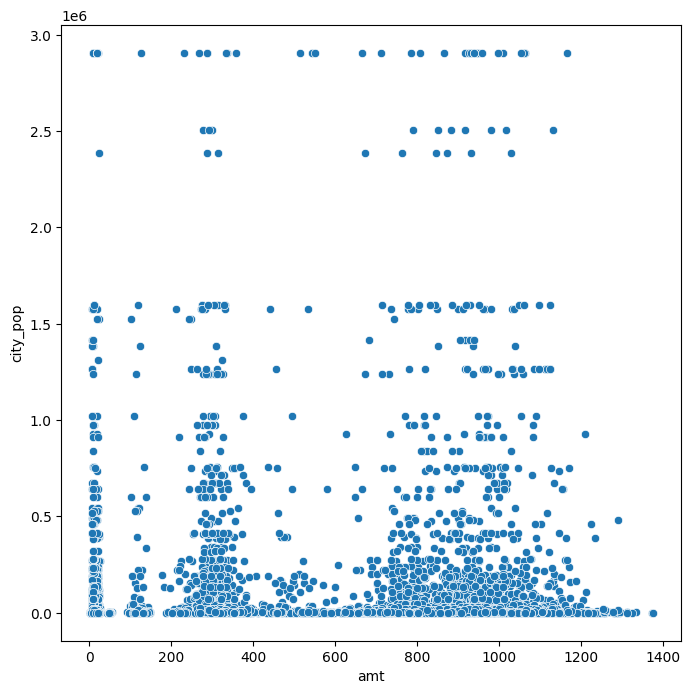

In [40]:
plt.figure(figsize = (8,8))
sns.scatterplot(data = fraudTrain[fraudTrain['is_fraud'] == 1], x = 'amt', y = 'city_pop')
plt.show()

- No clear relation between city population and the amount of spending

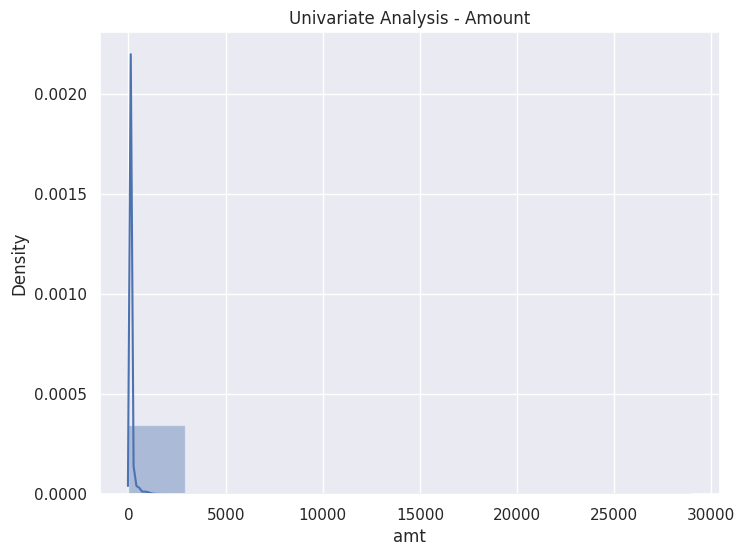

In [41]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable amt with log transformations

In [42]:
fraudTrain['amt'] = np.log(fraudTrain['amt'])

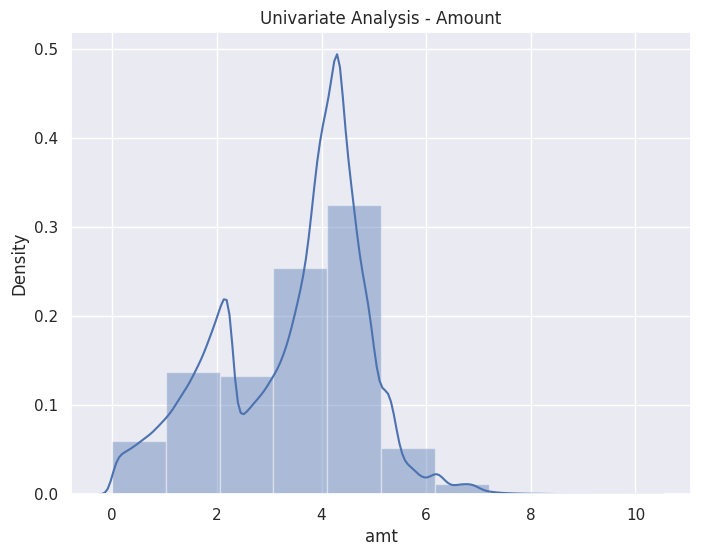

In [43]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- Skewness is treated

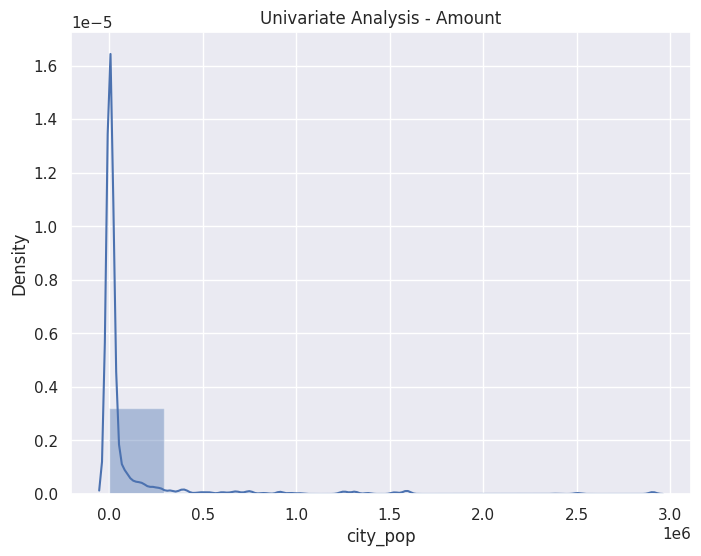

In [44]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable city_pop with log transformations

In [45]:
fraudTrain['city_pop'] = np.log(fraudTrain['city_pop'])

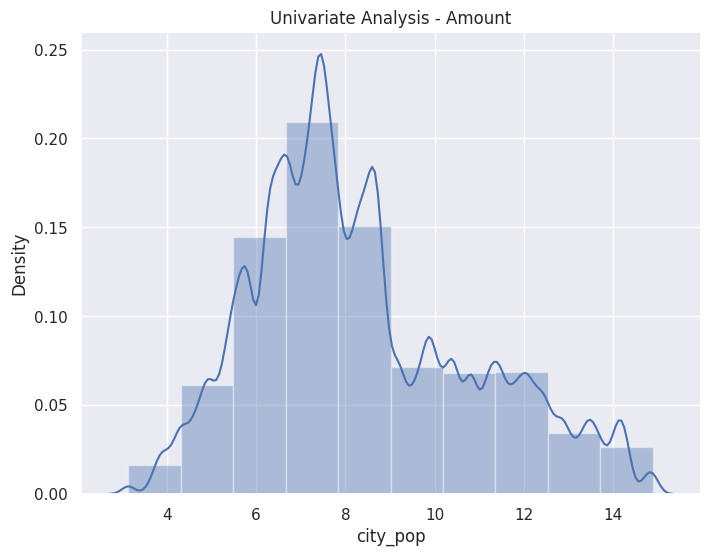

In [46]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

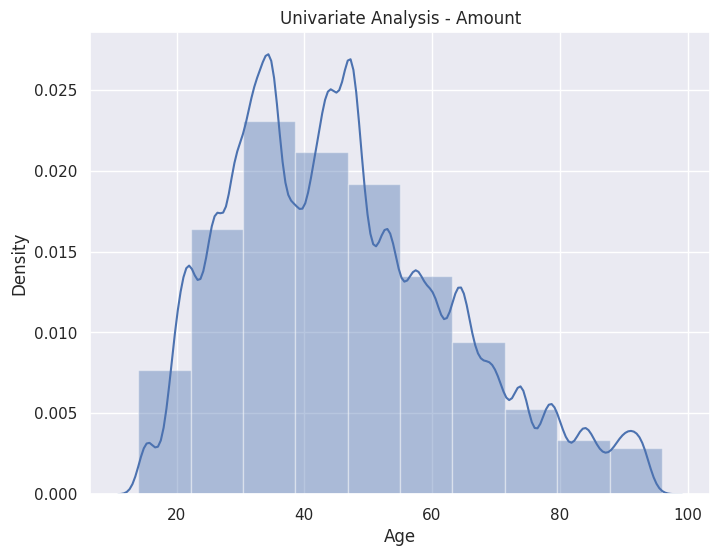

In [47]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['Age'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

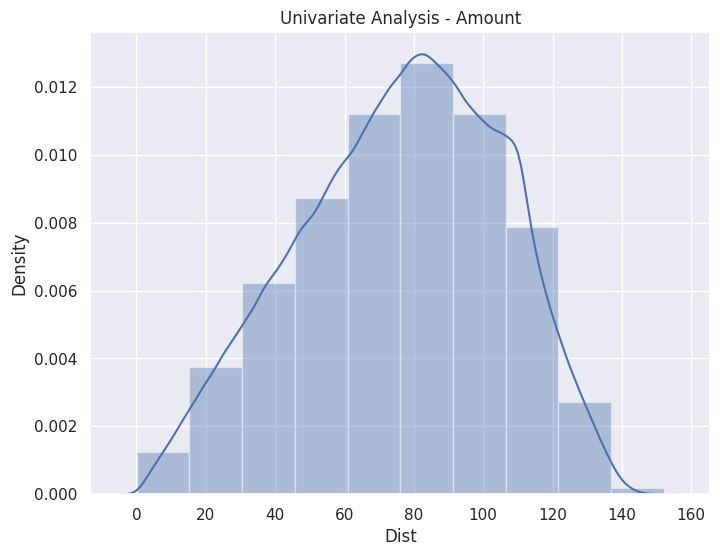

In [48]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['Dist'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- No major skewness found in Distance and Age variables

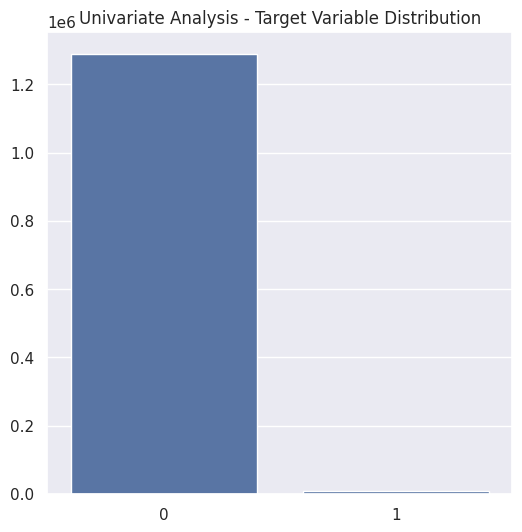

In [49]:
# Let us see the Target Variable distribution across the dataset

x = [0, 1]
y = [fraudTrain.is_fraud.value_counts()[0],fraudTrain.is_fraud.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Target Variable Distribution')
plt.show()

- The data shows clear imbalance in the target variable which needs to be handled by sampling methods

Text(0.5, 1.0, 'Univariate Analysis - Gender Distribution')

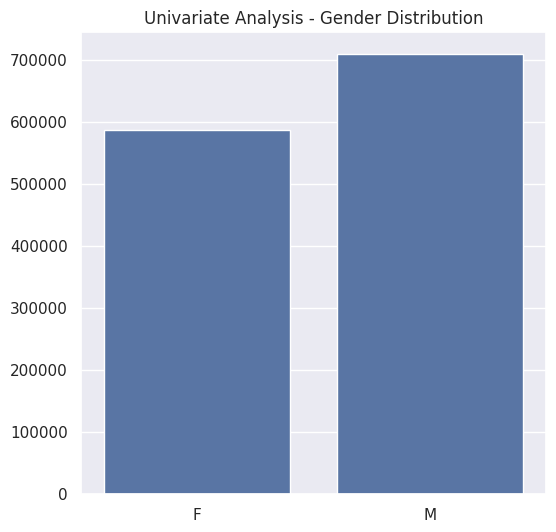

In [50]:
# Let us see the Gender distribution across the dataset

x = ['F', 'M']
y = [fraudTrain.gender.value_counts()[0], fraudTrain.gender.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Gender Distribution')

# `Train/Test Data Splitting`

In [51]:
y = fraudTrain.pop('is_fraud')
X = fraudTrain

In [52]:
from sklearn import model_selection

# To handle data imbalance while splitting, using the stratify method

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, stratify = y, random_state=42)

In [53]:
#Confirming shapes of the test and train datasets

X_train.shape, X_test.shape

((972506, 7), (324169, 7))

## Scaling of variables for Logistic Regression

In [54]:
fraudTrain.columns

Index(['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist'], dtype='object')

In [56]:
from sklearn.preprocessing import MinMaxScaler

X_train_lr = X_train.copy()

scaler = MinMaxScaler()
X_train_lr[['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']] = scaler.fit_transform(X_train[['amt','gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']])
X_train_lr.head()


,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
267436,0.482372,0.0,0.448670,0.353659,1.000000,0.363636,0.368918
233159,0.251400,1.0,0.230283,0.463415,0.833333,0.272727,0.627032
430072,0.441626,0.0,0.470635,0.560976,0.666667,0.545455,0.709002
236662,0.474693,1.0,0.698418,0.414634,1.000000,0.272727,0.475991
450357,0.462170,0.0,0.477590,0.841463,0.666667,0.545455,0.509887


In [57]:
# Making a copy of the X_train and scaling it as that is specific only to Logistic Regression

X_train_lr = X_train.copy()

scaler = MinMaxScaler()
X_train_lr[['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']] = scaler.fit_transform(X_train[['amt','gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']])
X_train_lr.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
267436,0.482372,0.0,0.448670,0.353659,1.000000,0.363636,0.368918
233159,0.251400,1.0,0.230283,0.463415,0.833333,0.272727,0.627032
430072,0.441626,0.0,0.470635,0.560976,0.666667,0.545455,0.709002
236662,0.474693,1.0,0.698418,0.414634,1.000000,0.272727,0.475991
450357,0.462170,0.0,0.477590,0.841463,0.666667,0.545455,0.509887


In [58]:
# Confirming if scaling has worked

X_train_lr.describe()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
count,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000
mean,0.338391,0.546699,0.444523,0.390577,0.511807,0.467545,0.500158
std,0.135778,0.497815,0.208761,0.212275,0.366377,0.310577,0.191454
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.221962,0.000000,0.295607,0.231707,0.166667,0.181818,0.363501
50%,0.377921,1.000000,0.397163,0.365854,0.500000,0.454545,0.513986
75%,0.432530,1.000000,0.577530,0.524390,0.833333,0.727273,0.647446
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# `Model Building and Hyperparameter Tuning`

> The algorithms that will be used in order to create classification models that would be sensitive to detecting fraudulent transactions are:
- Logistic Regression
- Decision Trees
- Random Forest

> Each algorithm will have an unsampled model and will then be compared by using sampling methods - SMOTE and ADASYN
> Let us proceed with the model building part in the order mentioned above:

## 1.1 Logistic Regression - Unsampled

In [60]:
from sklearn.linear_model import LogisticRegression


In [61]:
logreg_unsampled = LogisticRegression().fit(X_train_lr,y_train)

#### Hyperparameter tuning using Grid Search CV

In [62]:
from sklearn.model_selection import GridSearchCV

In [63]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_1 = GridSearchCV(estimator=logreg_unsampled,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [64]:
grid_search_1.fit(X_train_lr, y_train)


Fitting 5 folds for each of 7 candidates, totalling 35 fits


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [65]:
grid_search_1.best_score_

0.0

# `Model Evaluation`
> The metric used to evaluate the models is - Recall
- Recall attempts to answer the following question: What proportion of actual positives was identified correctly?
- Mathematically, recall is defined as:

![image.png](attachment:image.png)

In [66]:
def evaluate_model_lr_unsampled(classifier):
    y_train_pred = classifier.predict(X_train_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train, y_train_pred))
    print(metrics.confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [67]:
lr_unsampled = grid_search_1.best_estimator_
evaluate_model_lr_unsampled(lr_unsampled)

Train set performance:
0.0
[[966877      0]
 [  5629      0]]
-------------------------
Test set performance:
0.9973361747469366
[[  7756 314536]
 [     5   1872]]


#### ROC Curve

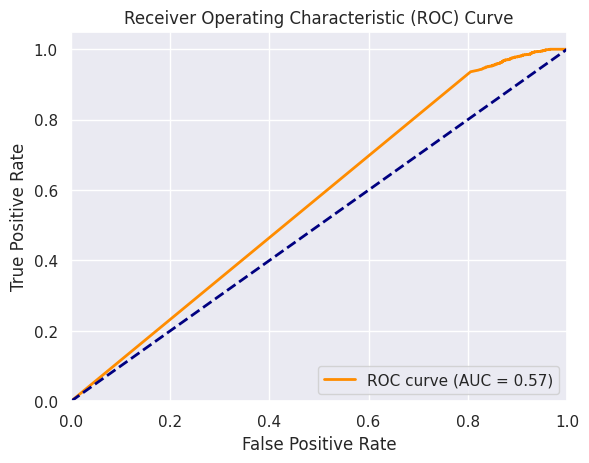

In [78]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get predicted probabilities for positive class (fraud) from the classifier
y_prob = logreg_unsampled.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Logistic Regression - Unsampled:
- Recall on Train: 0.0
- Recall on Test: 0.99
- Area Under the Curve: 0.52

## Let us try out two sampling methods - SMOTE and ADASYN

In [79]:
from imblearn.over_sampling import SMOTE, ADASYN

In [80]:
X_train_smote_lr, y_train_smote_lr = SMOTE().fit_resample(X_train_lr, y_train)
X_train_adasyn_lr, y_train_adasyn_lr = ADASYN().fit_resample(X_train_lr, y_train)

1.2 Logistic Regression with SMOTE


In [81]:
from sklearn.linear_model import LogisticRegression


In [82]:
logreg_smote = LogisticRegression().fit(X_train_smote_lr,y_train_smote_lr)


In [83]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_2 = GridSearchCV(estimator=logreg_smote,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [84]:
grid_search_2.fit(X_train_smote_lr, y_train_smote_lr)


Fitting 5 folds for each of 7 candidates, totalling 35 fits


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [85]:
grid_search_2.best_score_


0.7798820328531113

In [86]:
def evaluate_model_lr_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train_smote_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_smote_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [87]:
lr_smote = grid_search_2.best_estimator_
evaluate_model_lr_smote(lr_smote)

Train set performance:
0.7798851353377937
[[777877 189000]
 [212824 754053]]
-------------------------
Test set performance:
1.0
[[     0 322292]
 [     0   1877]]


#### ROC Curve

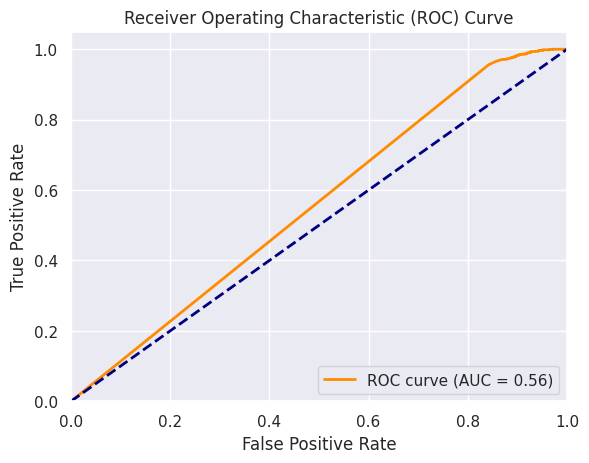

In [90]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'logreg_smote' is your trained logistic regression model using SMOTE
y_prob = logreg_smote.predict_proba(X_test)[:, 1]  # Get predicted probabilities for positive class (fraud)

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Logistic Regression - SMOTE:
- Recall on Train: 0.77
- Recall on Test: 1.0
- Area Under the Curve: 0.56

## 1.3 Logistic Regression with ADASYN

In [92]:
logreg_adasyn = LogisticRegression().fit(X_train_adasyn_lr,y_train_adasyn_lr)

In [93]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_3 = GridSearchCV(estimator=logreg_adasyn,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [94]:
grid_search_3.fit(X_train_adasyn_lr, y_train_adasyn_lr)


Fitting 5 folds for each of 7 candidates, totalling 35 fits


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [95]:
grid_search_3.best_score_

0.7300224631014537

In [96]:
def evaluate_model_lr_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train_adasyn_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_adasyn_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [97]:
lr_adasyn = grid_search_3.best_estimator_
evaluate_model_lr_adasyn(lr_adasyn)

Train set performance:
0.7300193561195116
[[723261 243616]
 [261108 706028]]
-------------------------
Test set performance:
1.0
[[    20 322272]
 [     0   1877]]


#### ROC Curve

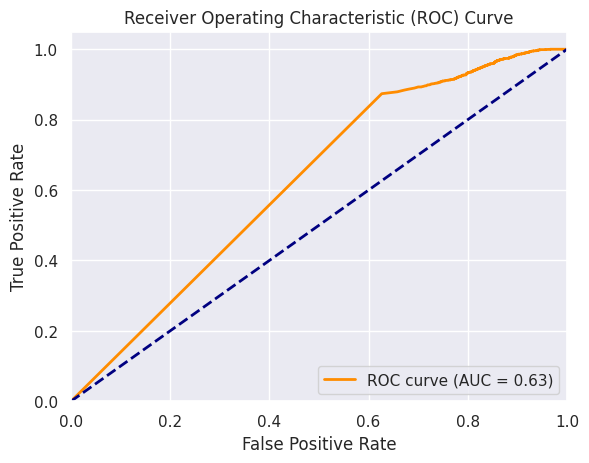

In [99]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'logreg_adasyn' is your trained logistic regression model using ADASYN
y_prob = logreg_adasyn.predict_proba(X_test)[:, 1]  # Get predicted probabilities for positive class (fraud)

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Logistic Regression - ADASYN:
- Recall on Train: 0.73
- Recall on Test: 1.0
- Area Under the Curve: 0.60

# 2.1 Decision Tree Classifier - Unsampled

In [100]:
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

### Creating Helper Functions

In [101]:
def get_graph(classifier):
    dot_data = StringIO()

    export_graphviz(classifier, out_file = dot_data, filled = True, rounded = True,
               feature_names=X.columns,
               class_names=['No Fraud', 'Fraud'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [102]:
def evaluate_model_unsampled(classifier):
    y_train_pred = classifier.predict(X_train)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train, y_train_pred))
    print(confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

### Hyper-parameter tuning using Grid Search CV

In [103]:
dt_unsampled = DecisionTreeClassifier(random_state=42).fit(X_train,y_train)

#### After various trial and error methods, fixing hyper-parameters to:

In [104]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_4 = GridSearchCV(estimator=dt_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [107]:
grid_search_4.fit(X_train, y_train)


Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [108]:
grid_search_4.best_score_


0.3252772843891849

In [109]:
dt_best = grid_search_4.best_estimator_
evaluate_model_unsampled(dt_best)

Train set performance:
0.3334517676319062
[[966122    755]
 [  3752   1877]]
-------------------------
Test set performance:
0.30420884389984015
[[322024    268]
 [  1306    571]]


In [110]:
grid_search_4.best_params_


{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 80}

In [111]:
gph = get_graph(dt_best)
Image(gph.create_png())

#### ROC Curve

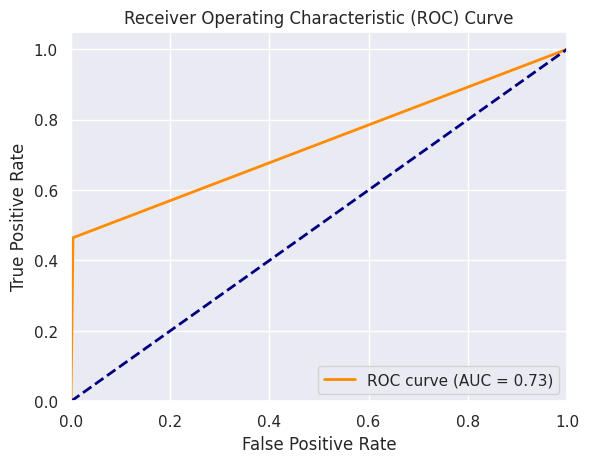

In [113]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'dt_unsampled' is your trained decision tree classifier
y_prob = dt_unsampled.predict_proba(X_test)[:, 1]  # Get predicted probabilities for positive class

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Decision Trees - Unsampled:
- Recall on Train: 0.30
- Recall on Test: 0.28
- Area Under the Curve: 0.73

## 2.2 Decision Tree with SMOTE

In [114]:
X_train_smote, y_train_smote = SMOTE().fit_resample(X_train, y_train)

In [115]:
dt_smote = DecisionTreeClassifier(random_state=42).fit(X_train_smote,y_train_smote)

### Creating Helper Functions

In [116]:
def evaluate_model_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train_smote, y_train_pred))
    print(confusion_matrix(y_train_smote, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [117]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_5 = GridSearchCV(estimator=dt_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [118]:
%%time
grid_search_5.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 33.4 s, sys: 2.63 s, total: 36 s
Wall time: 18min 15s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [119]:
grid_search_5.best_score_


0.8564429616139281

In [120]:
dt_smote = grid_search_5.best_estimator_
evaluate_model_smote(dt_smote)


Train set performance:
0.8570997138208893
[[895941  70936]
 [138167 828710]]
-------------------------
Test set performance:
0.825253063399041
[[298449  23843]
 [   328   1549]]


In [121]:
grid_search_5.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.367014 to fit



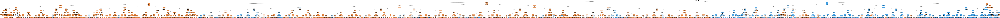

In [122]:
gph = get_graph(dt_smote)
Image(gph.create_png())

#### ROC Curve

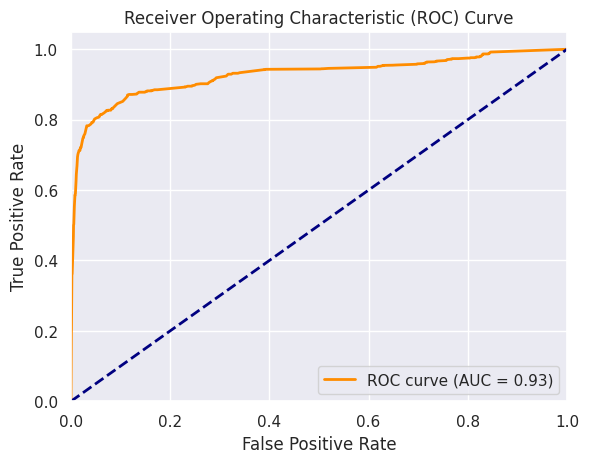

In [123]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'dt_smote' is your trained decision tree classifier using SMOTE
# Get predicted probabilities for the positive class (fraud)
y_prob = dt_smote.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Decision Trees - SMOTE:
- Recall on Train: 0.85
- Recall on Test: 0.82
- Area Under the Curve: 0.93

## 2.3 Decision Tree with ADASYN

In [124]:
X_train_adasyn, y_train_adasyn = ADASYN().fit_resample(X_train, y_train)

In [125]:
def evaluate_model_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train_adasyn, y_train_pred))
    print(confusion_matrix(y_train_adasyn, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [126]:
dt_adasyn = DecisionTreeClassifier(random_state=42).fit(X_train_adasyn,y_train_adasyn)

In [127]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_6 = GridSearchCV(estimator=dt_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [129]:
%%time
grid_search_6.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 25.2 s, sys: 2.44 s, total: 27.6 s
Wall time: 17min 5s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [130]:
grid_search_6.best_score_


0.8451429186817112

In [131]:
dt_adasyn = grid_search_6.best_estimator_
evaluate_model_adasyn(dt_adasyn)

Train set performance:
0.849706340719372
[[871127  95750]
 [145043 820021]]
-------------------------
Test set performance:
0.8529568460309004
[[290367  31925]
 [   276   1601]]


In [132]:
grid_search_6.best_params_


{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 50}

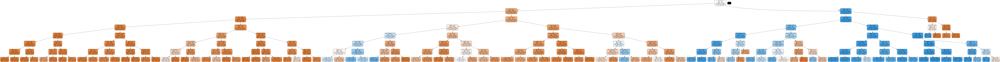

In [133]:
gph = get_graph(dt_adasyn)
Image(gph.create_png())

#### ROC Curve

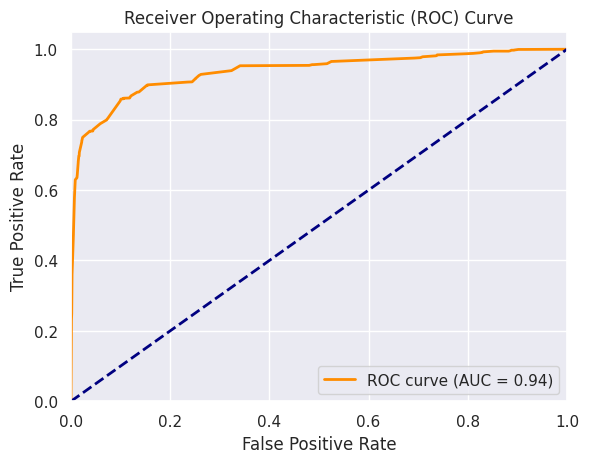

In [134]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'dt_adasyn' is your trained decision tree classifier using ADASYN
# Get predicted probabilities for the positive class (fraud)
y_prob = dt_adasyn.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Decision Trees - ADASYN:
- Recall on Train: 0.85
- Recall on Test: 0.82
- Area Under the Curve: 0.94

# 3.1 Random Forest - Unsampled

In [135]:
from sklearn.ensemble import RandomForestClassifier

In [137]:
rf_unsampled = RandomForestClassifier(random_state=42).fit(X_train, y_train)

#### After various trial and error methods, fixing hyper-parameters to:

In [138]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:


params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_7 = GridSearchCV(estimator=rf_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [139]:
grid_search_7.fit(X_train, y_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [140]:
rf_best = grid_search_7.best_estimator_
evaluate_model_unsampled(rf_best)

Train set performance:
0.25421922188665835
[[966444    433]
 [  4198   1431]]
-------------------------
Test set performance:
0.2269579115610016
[[322131    161]
 [  1451    426]]


In [141]:
grid_search_7.best_params_


{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 15}

#### ROC Curve

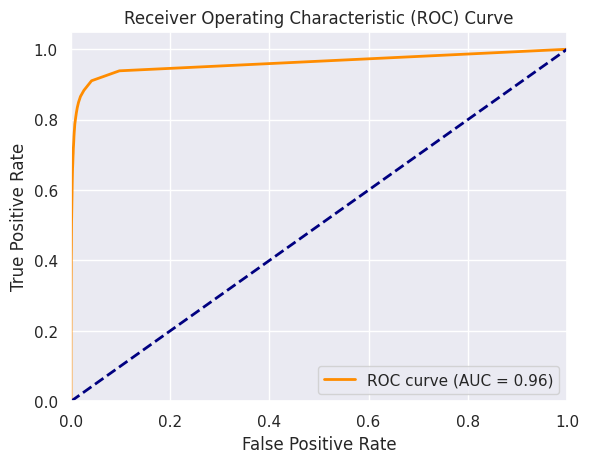

In [142]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'rf_unsampled' is your trained random forest classifier
# Get predicted probabilities for the positive class (fraud)
y_prob = rf_unsampled.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Random Forest - Unsampled:
- Recall on Train: 0.22
- Recall on Test: 0.18
- Area Under the Curve: 0.96

# 3.2 Random Forest - SMOTE

In [143]:
rf_smote = RandomForestClassifier(random_state=42).fit(X_train_smote, y_train_smote)

In [144]:
params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_8 = GridSearchCV(estimator=rf_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [147]:
grid_search_8.fit(X_train_smote, y_train_smote)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [148]:
rf_smote = grid_search_8.best_estimator_
evaluate_model_smote(rf_smote)

Train set performance:
0.828277019724329
[[924100  42777]
 [166035 800842]]
-------------------------
Test set performance:
0.7938199254128929
[[307961  14331]
 [   387   1490]]


In [149]:
grid_search_8.best_params_


{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 80,
 'n_estimators': 10}

#### ROC Curve

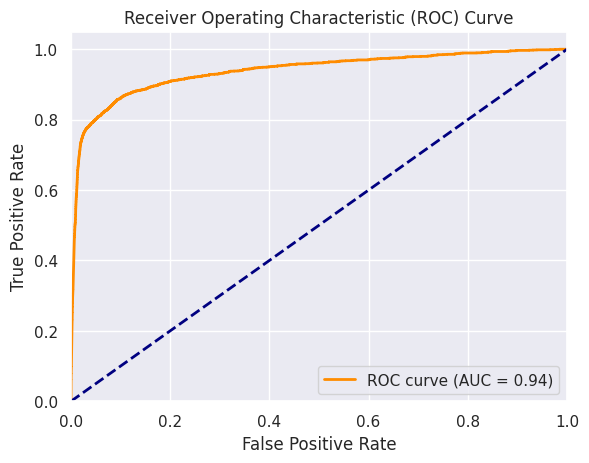

In [150]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'rf_smote' is your trained random forest classifier using SMOTE
# Get predicted probabilities for the positive class (fraud)
y_prob = rf_smote.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Random Forest - SMOTE:
- Recall on Train: 0.82
- Recall on Test: 0.78
- Area Under the Curve: 0.94

# 3.3 Random Forest - ADASYN

In [152]:
from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier

# Enable tqdm progress bar
rf_adasyn = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1, verbose=1).fit(X_train_adasyn, y_train_adasyn)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  5.1min finished


In [153]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:

params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_9 = GridSearchCV(estimator=rf_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [157]:
grid_search_9.fit(X_train_adasyn, y_train_adasyn)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  2.0min finished


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(n_estimators=50, n_jobs=-1,
                                              random_state=42, verbose=1),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [158]:
grid_search_9.best_score_


0.8110249724016286

In [159]:
rf_adasyn = grid_search_9.best_estimator_
evaluate_model_adasyn(rf_adasyn)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  30 out of  30 | elapsed:    8.9s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  30 out of  30 | elapsed:    1.2s finished


Train set performance:
0.8173903492410866
[[923944  42933]
 [176230 788834]]
-------------------------
Test set performance:
0.786893979754928
[[307777  14515]
 [   400   1477]]


In [160]:
grid_search_9.best_params_


{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  30 out of  30 | elapsed:    1.1s finished


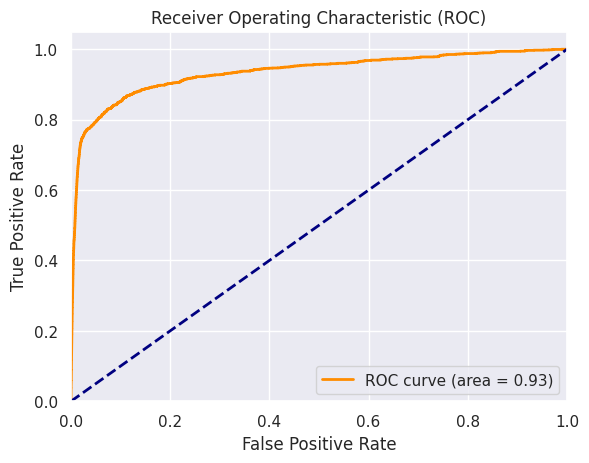

In [161]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 1. Get the predicted probabilities for the positive class
y_test_proba = rf_adasyn.predict_proba(X_test)[:, 1]

# 2. Calculate the ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_proba)

# 3. Calculate the AUC
roc_auc = auc(fpr, tpr)

# 4. Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Random Forest - ADASYN:
- Recall on Train: 0.81
- Recall on Test: 0.79
- Area Under the Curve: 0.93

# 4.1 XGBoost - Unsampled

In [162]:
from xgboost import XGBClassifier

In [163]:
xgb_unsampled = XGBClassifier().fit(X_train, y_train)

In [164]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1,0.3,0.5]
}

grid_search_10 = GridSearchCV(estimator=xgb_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [165]:
grid_search_10.fit(X_train, y_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'],
                         'learning_rate': [0.1, 0.3, 0.5], 'max_depth': [10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [166]:
xgb_best_unsampled = grid_search_10.best_estimator_
evaluate_model_unsampled(xgb_best_unsampled)

Train set performance:
0.7059868537928584
[[966739    138]
 [  1655   3974]]
-------------------------
Test set performance:
0.4912093766648908
[[322062    230]
 [   955    922]]


In [167]:
grid_search_10.best_params_

{'criterion': 'gini',
 'learning_rate': 0.5,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

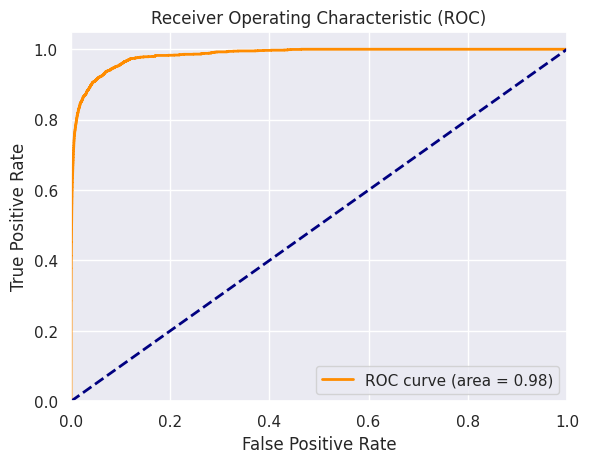

In [169]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 1. Get the predicted probabilities for the positive class
y_test_proba = xgb_unsampled.predict_proba(X_test)[:, 1]

# 2. Calculate the ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_proba)

# 3. Calculate the AUC
roc_auc = auc(fpr, tpr)

# 4. Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for XGBoost - Unsampled:
- Recall on Train: 0.67
- Recall on Test: 0.47
- Area Under the Curve: 0.98

# 4.2 XGBoost - SMOTE

In [170]:
xgb_smote = XGBClassifier().fit(X_train_smote, y_train_smote)

In [171]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_11 = GridSearchCV(estimator=xgb_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [172]:
%%time
grid_search_11.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: user 23.3 s, sys: 852 ms, total: 24.1 s
Wall time: 2min 55s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [173]:
xgb_best_smote = grid_search_11.best_estimator_
evaluate_model_smote(xgb_best_smote)

Train set performance:
0.8684899940737033
[[912773  54104]
 [127154 839723]]
-------------------------
Test set performance:
0.8092701118806607
[[303880  18412]
 [   358   1519]]


In [174]:
grid_search_11.best_params_


{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

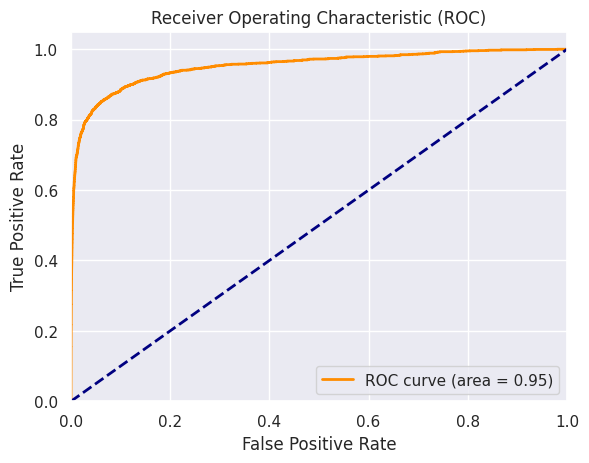

In [175]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 1. Get the predicted probabilities for the positive class
y_test_proba = xgb_smote.predict_proba(X_test)[:, 1]

# 2. Calculate the ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_proba)

# 3. Calculate the AUC
roc_auc = auc(fpr, tpr)

# 4. Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for XGBoost - SMOTE:
- Recall on Train: 0.87
- Recall on Test: 0.80
- Area Under the Curve: 0.95

# 4.3 XGBoost - ADASYN

In [176]:
xgb_adasyn = XGBClassifier().fit(X_train_adasyn, y_train_adasyn)

In [177]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_12 = GridSearchCV(estimator=xgb_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [178]:
grid_search_12.fit(X_train_adasyn, y_train_adasyn)


Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [179]:
xgb_best_adasyn = grid_search_12.best_estimator_
evaluate_model_adasyn(xgb_best_adasyn)

Train set performance:
0.8656949176427677
[[910423  56454]
 [129613 835451]]
-------------------------
Test set performance:
0.8114011720831114
[[303132  19160]
 [   354   1523]]


In [180]:
grid_search_12.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

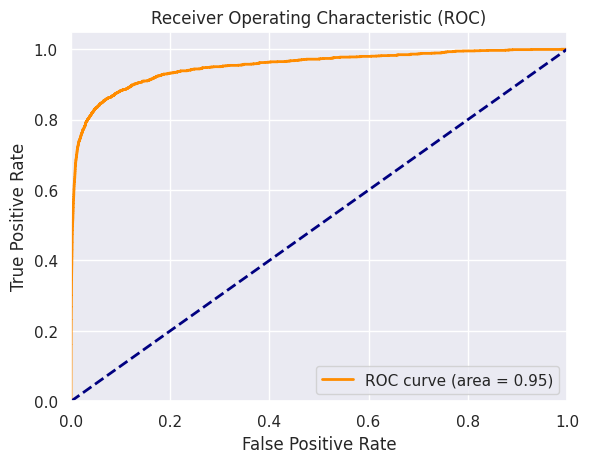

In [181]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 1. Get the predicted probabilities for the positive class
y_test_proba = xgb_adasyn.predict_proba(X_test)[:, 1]

# 2. Calculate the ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_proba)

# 3. Calculate the AUC
roc_auc = auc(fpr, tpr)

# 4. Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


> #### Metrics for Random Forest - ADASYN:
- Recall on Train: 0.86
- Recall on Test: 0.80
- Area Under the Curve: 0.95

# `Testing the results on the unseen Test Data:`

In [187]:
file_path = '/content/gdrive/MyDrive/archive/fraudTest.csv'


In [192]:
#Read the CSV file using pandas
df_test = pd.read_csv(file_path)
df_test.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [193]:
# Considering only the relevant columns/features in a new dataframe

fraudTest = df_test[['trans_date_trans_time','amt','gender','lat','long','city_pop','dob','merch_lat','merch_long','is_fraud']]
fraudTest.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2.86,M,33.9659,-80.9355,333497,1968-03-19,33.986391,-81.200714,0
1,2020-06-21 12:14:33,29.84,F,40.3207,-110.4360,302,1990-01-17,39.450498,-109.960431,0
2,2020-06-21 12:14:53,41.28,F,40.6729,-73.5365,34496,1970-10-21,40.495810,-74.196111,0
3,2020-06-21 12:15:15,60.05,M,28.5697,-80.8191,54767,1987-07-25,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3.19,M,44.2529,-85.0170,1126,1955-07-06,44.959148,-85.884734,0


In [194]:
fraudTrain.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
0,1.603420,1,8.159089,31,2,1,78.597568
1,4.674976,1,5.003946,41,2,1,30.212176
2,5.394127,0,8.331827,57,2,1,108.206083
3,3.806662,0,7.569928,52,2,1,95.673231
4,3.736717,0,4.595120,33,2,1,77.556744


In [195]:
# Converting columns to datetime for fraudTest

fraudTest.dob = pd.to_datetime(fraudTest['dob'])
fraudTest.trans_date_trans_time = pd.to_datetime(fraudTest['trans_date_trans_time'])

In [196]:
# Creating a new column called Transaction date and converting into datetime

fraudTest['Transaction_Date'] = pd.to_datetime(fraudTest['trans_date_trans_time'], format='%Y:%M:%D').dt.date
fraudTest.Transaction_Date = pd.to_datetime(fraudTest['Transaction_Date'])

In [197]:
# Creating a new column called Transaction Time

fraudTest['Transaction_Time'] = pd.to_datetime(fraudTest['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [198]:
# Creating a new column called Age

fraudTest['Age'] = round((fraudTest['Transaction_Date'] - fraudTest['dob'])/np.timedelta64(1, 'Y'))
fraudTest.Age = fraudTest.Age.astype('int')

In [199]:
fraudTest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   trans_date_trans_time  555719 non-null  datetime64[ns]
 1   amt                    555719 non-null  float64       
 2   gender                 555719 non-null  object        
 3   lat                    555719 non-null  float64       
 4   long                   555719 non-null  float64       
 5   city_pop               555719 non-null  int64         
 6   dob                    555719 non-null  datetime64[ns]
 7   merch_lat              555719 non-null  float64       
 8   merch_long             555719 non-null  float64       
 9   is_fraud               555719 non-null  int64         
 10  Transaction_Date       555719 non-null  datetime64[ns]
 11  Transaction_Time       555719 non-null  object        
 12  Age                    555719 non-null  int6

In [200]:
# Calling the function created earlier to calculate the Day of the Week

fraudTest['Day_of_Week'] = fraudTest['Transaction_Date'].apply(DoW)


In [201]:
# Creating a new column Month

fraudTest['Month'] = pd.DatetimeIndex(fraudTest.trans_date_trans_time).month

# Making Gender column binary

fraudTest['gender'] = fraudTest['gender'].map({'F':1, 'M':0})

# Ensuring Day of Week is represented numerically
fraudTest['Day_of_Week'] = fraudTest['Day_of_Week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [202]:
# Calling the function created earlier to calculate the Distance between the customer's home location and
# the location of transactions (fraudulent or otherwise)

Dist2 = []
for a,b,c,d in zip(fraudTest['lat'], fraudTest['long'], fraudTest['merch_lat'], fraudTest['merch_long']):
    Dist2.append(haversineDistance(a,b,c,d))

In [203]:
# Adding the calculated Distance column in the test dataframe

fraudTest['Dist'] = Dist2
fraudTest.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud,Transaction_Date,Transaction_Time,Age,Day_of_Week,Month,Dist
0,2020-06-21 12:14:25,2.86,0,33.9659,-80.9355,333497,1968-03-19,33.986391,-81.200714,0,2020-06-21,12:14:25,52,7,6,24.561462
1,2020-06-21 12:14:33,29.84,1,40.3207,-110.4360,302,1990-01-17,39.450498,-109.960431,0,2020-06-21,12:14:33,30,7,6,104.925092
2,2020-06-21 12:14:53,41.28,1,40.6729,-73.5365,34496,1970-10-21,40.495810,-74.196111,0,2020-06-21,12:14:53,50,7,6,59.080078
3,2020-06-21 12:15:15,60.05,0,28.5697,-80.8191,54767,1987-07-25,28.812398,-80.883061,0,2020-06-21,12:15:15,33,7,6,27.698567
4,2020-06-21 12:15:17,3.19,0,44.2529,-85.0170,1126,1955-07-06,44.959148,-85.884734,0,2020-06-21,12:15:17,65,7,6,104.335106


In [204]:
# Dropping unnecessary columns

fraudTest.drop(['trans_date_trans_time','Transaction_Date','Transaction_Time','dob',
                 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
fraudTest.head()

,amt,gender,city_pop,is_fraud,Age,Day_of_Week,Month,Dist
0,2.86,0,333497,0,52,7,6,24.561462
1,29.84,1,302,0,30,7,6,104.925092
2,41.28,1,34496,0,50,7,6,59.080078
3,60.05,0,54767,0,33,7,6,27.698567
4,3.19,0,1126,0,65,7,6,104.335106


In [205]:
fraudTest['amt'] = np.log(fraudTest['amt'])
fraudTest['city_pop'] = np.log(fraudTest['city_pop'])

## `Model Selection and Model Building`
> Based on the Recall scores, AUC Scores, and Confusion Matrices collected from the 12 algorithms (4 algorithms - unsampled and sampled), following is the summary of all values to help us pick the best model of all:

In [206]:
summary_dict = {
    'Model': ['Logistic Regression - Unsampled', 'Logistic Regression - SMOTE', 'Logistic Regression - ADASYN',
             'Decision Trees - Unsampled', 'Decision Trees - SMOTE', 'Decision Trees - ADASYN',
             'Random Forest - Unsampled', 'Random Forest - SMOTE', 'Random Forest - ADASYN',
             'XGBoost - Unsampled', 'XGBoost - SMOTE', 'XGBoost - ADASYN'],
    'Recall on Train' : [0.0,0.77,0.73,0.30,0.85,0.85,0.22,0.82,0.81,0.67,0.87,0.86],
    'Recall on Test' : [0.99,1.0,1.0,0.28,0.82,0.82,0.18,0.78,0.79,0.47,0.80,0.80],
    'AUC Score' : [0.52,0.56,0.60,0.73,0.93,0.93,0.96,0.94,0.93,0.98,0.95,0.95]
}

summary_df = pd.DataFrame(summary_dict)
summary_df

,Model,Recall on Train,Recall on Test,AUC Score
0,Logistic Regression - Unsampled,0.00,0.99,0.52
1,Logistic Regression - SMOTE,0.77,1.00,0.56
2,Logistic Regression - ADASYN,0.73,1.00,0.60
3,Decision Trees - Unsampled,0.30,0.28,0.73
4,Decision Trees - SMOTE,0.85,0.82,0.93
5,Decision Trees - ADASYN,0.85,0.82,0.93
6,Random Forest - Unsampled,0.22,0.18,0.96
7,Random Forest - SMOTE,0.82,0.78,0.94
8,Random Forest - ADASYN,0.81,0.79,0.93
9,XGBoost - Unsampled,0.67,0.47,0.98


In [207]:
summary_df.sort_values('AUC Score', ascending = False)

,Model,Recall on Train,Recall on Test,AUC Score
9,XGBoost - Unsampled,0.67,0.47,0.98
6,Random Forest - Unsampled,0.22,0.18,0.96
10,XGBoost - SMOTE,0.87,0.80,0.95
11,XGBoost - ADASYN,0.86,0.80,0.95
7,Random Forest - SMOTE,0.82,0.78,0.94
4,Decision Trees - SMOTE,0.85,0.82,0.93
5,Decision Trees - ADASYN,0.85,0.82,0.93
8,Random Forest - ADASYN,0.81,0.79,0.93
3,Decision Trees - Unsampled,0.30,0.28,0.73
2,Logistic Regression - ADASYN,0.73,1.00,0.60


### Based on the AUC Scores & Recall on Train and Test, checking the final test dataset

In [208]:
# Splitting the test data into X and y:

y_final = fraudTest.pop('is_fraud')
X_final = fraudTest

### Testing the unseen data by using XGBoost - ADASYN Modelled Predictors:

In [209]:
y_pred_xgb = xgb_best_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_xgb))
print(confusion_matrix(y_final, y_pred_xgb))

0.7361305361305361
[[530560  23014]
 [   566   1579]]


`XGBoost - ADASYN has a 73.6% recall score`

### Testing the unseen data by using XGBoost - SMOTE Modelled Predictors:

In [210]:
y_pred_xgb_ = xgb_best_smote.predict(X_final)
print(recall_score(y_final, y_pred_xgb_))
print(confusion_matrix(y_final, y_pred_xgb_))

0.7249417249417249
[[531832  21742]
 [   590   1555]]


`Decision Tree - SMOTE has a 72.4% recall score`

### Testing the unseen data by using Decision Tree - SMOTE Modelled Predictors:

In [212]:
y_pred_final_dt = dt_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_dt))
print(confusion_matrix(y_final, y_pred_final_dt))

0.7664335664335664
[[522559  31015]
 [   501   1644]]


`Decision Tree - SMOTE has a 76.6% recall score`

### Testing the unseen data by using Decision Tree - ADASYN Modelled Predictors:

In [213]:
y_pred_final_dt_ = dt_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_dt_))
print(confusion_matrix(y_final, y_pred_final_dt_))

0.7743589743589744
[[518918  34656]
 [   484   1661]]


`Decision Tree - ADASYN has a 77.4% recall score`

### Testing the unseen data by using Random Forest - SMOTE Modelled Predictors:

In [215]:
y_pred_final_rf = rf_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_rf))
print(confusion_matrix(y_final, y_pred_final_rf))

0.7571095571095571
[[534559  19015]
 [   521   1624]]


`Random Forest - SMOTE has a 75% recall score`

### Testing the unseen data by using Random Forest - ADASYN Modelled Predictors:

In [216]:
y_pred_final_rf_ = rf_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_rf_))
print(confusion_matrix(y_final, y_pred_final_rf_))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  30 out of  30 | elapsed:    1.2s finished


0.7561771561771562
[[535670  17904]
 [   523   1622]]


`Random Forest - ADASYN has a 75.6% recall score`

> ## Decision Trees - ADASYN model is the best as it has 77.4% Sensitivity towards predicting Fraudulent Transactions

In [217]:
# Let us check the confusion matrix for this test data:

cnf = confusion_matrix(y_final, y_pred_final_dt_)
cnf

array([[518918,  34656],
       [   484,   1661]])

In [218]:
# Creating a dataframe to compare the actual v/s predicted values of y:

y_pred_final_dt_ = pd.Series(y_pred_final_dt_)
df_pred = pd.concat([X_final, y_final,y_pred_final_dt_], axis = 1)
df_pred.rename(columns = {0:'y_pred'}, inplace = True)
df_pred.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist,is_fraud,y_pred
0,1.050822,0,12.717389,52,7,6,24.561462,0,0
1,3.395850,1,5.710427,30,7,6,104.925092,0,0
2,3.720378,1,10.448599,50,7,6,59.080078,0,0
3,4.095178,0,10.910843,33,7,6,27.698567,0,0
4,1.160021,0,7.026427,65,7,6,104.335106,0,0


In [219]:
# Extracting only the fraudulent transactions from this test dataset:

fraud_df = df_pred[df_pred.is_fraud==1]
fraud_df.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist,is_fraud,y_pred
1685,3.212455,1,3.135494,51,7,6,80.649140,1,0
1767,6.659960,0,7.174724,62,7,6,66.097917,1,1
1781,6.430252,0,7.174724,62,7,6,28.837509,1,1
1784,6.982575,0,11.175142,26,7,6,103.089027,1,1
1857,6.736552,1,3.135494,51,7,6,60.504949,1,1


### Let's check the AUC on the final test data

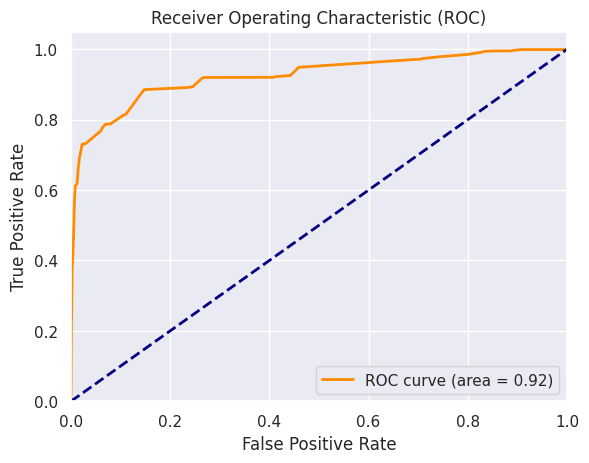

In [220]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 1. Get the predicted probabilities for the positive class
y_final_proba = dt_adasyn.predict_proba(X_final)[:, 1]

# 2. Calculate the ROC curve
fpr, tpr, _ = roc_curve(y_final, y_final_proba)

# 3. Calculate the AUC
roc_auc = auc(fpr, tpr)

# 4. Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


`Area Under the Curve is 0.92`

> # `Cost Benefit Analysis`
- The Cost Benefit Analysis is to be done on the original data
- Merging the train and test data to make an original dataframe

In [222]:
# Let us merge the dataset to form the original

fraud = pd.concat([df, df_test], axis=0)
fraud.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


#### Let us take a look at what we need to do in order to perform the cost-benefit analysis step by step:
- ### Part I: Analyse the dataset and find the following figures:

> 1. Average number of transactions per month
> 2. Average number of fraudulent transactions per month
> 3. Average amount per fraudulent transaction

In [228]:
# Since the given (original) dataset is from Jan 1 2019 to Dec 31 2020, the data is of 24 months
# Total transactions can be found by checking the shape of the original dataframe
# Avg transactions per month would be to divide that shape/total by 24 (months)

avg_transactions_pm = fraud.shape[0]//24

In [229]:
print("1. Average number of transactions per month are:", avg_transactions_pm)

1. Average number of transactions per month are: 46309


In [230]:
# Checking only for fraudulent transactions:

fraud[fraud.is_fraud == 1]

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
1685,1685,2020-06-21 22:06:39,3560725013359375,fraud_Hamill-D'Amore,health_fitness,24.84,Brooke,Smith,F,63542 Luna Brook Apt. 012,Notrees,TX,79759,31.8599,-102.7413,23,Cytogeneticist,1969-09-15,16bf2e46c54369a8eab2214649506425,1371852399,32.575873,-102.604290,1
1767,1767,2020-06-21 22:32:22,6564459919350820,"fraud_Rodriguez, Yost and Jenkins",misc_net,780.52,Douglas,Willis,M,619 Jeremy Garden Apt. 681,Benton,WI,53803,42.5545,-90.3508,1306,Public relations officer,1958-09-10,ab4b379d2c0c9c667d46508d4e126d72,1371853942,42.461127,-91.147148,1
1781,1781,2020-06-21 22:37:27,6564459919350820,fraud_Nienow PLC,entertainment,620.33,Douglas,Willis,M,619 Jeremy Garden Apt. 681,Benton,WI,53803,42.5545,-90.3508,1306,Public relations officer,1958-09-10,47a9987ae81d99f7832a54b29a77bf4b,1371854247,42.771834,-90.158365,1
1784,1784,2020-06-21 22:38:55,4005676619255478,"fraud_Heathcote, Yost and Kertzmann",shopping_net,1077.69,William,Perry,M,458 Phillips Island Apt. 768,Denham Springs,LA,70726,30.4590,-90.9027,71335,Herbalist,1994-05-31,fe956c7e4a253c437c18918bf96f7b62,1371854335,31.204974,-90.261595,1
1857,1857,2020-06-21 23:02:16,3560725013359375,fraud_Hermann and Sons,shopping_pos,842.65,Brooke,Smith,F,63542 Luna Brook Apt. 012,Notrees,TX,79759,31.8599,-102.7413,23,Cytogeneticist,1969-09-15,f6838c01f5d2262006e6b71d33ba7c6d,1371855736,31.315782,-102.736390,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197,517197,2020-12-22 22:05:48,2242176657877538,"fraud_Willms, Kris and Bergnaum",shopping_pos,1041.51,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,35b0297dd026d2e9a75d024a5dec7955,1387749948,34.573471,-89.911011,1
517274,517274,2020-12-22 22:18:07,2242176657877538,fraud_Kuhn LLC,shopping_pos,868.09,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,da7f67d7375f10a054a3d919448c45dd,1387750687,34.091227,-90.390612,1
517341,517341,2020-12-22 22:31:48,2242176657877538,"fraud_Mosciski, Ziemann and Farrell",shopping_net,1039.42,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,25b076c7bcd70f272c1c5326bb234f4b,1387751508,34.628434,-90.284780,1
517529,517529,2020-12-22 23:06:03,2242176657877538,fraud_Bauch-Raynor,grocery_pos,289.27,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,2df7d894868fbc99ec1d8b055585fc9d,1387753563,34.746063,-90.401093,1


In [231]:
# Fraudulent transactions are 9651 (number of rows) that are spread across 24 months
# Avg fraudulent transactions per month would be to divide the shape/total fraudulent rows by 24 (months)

avg_fraudtrans_pm = fraud[fraud.is_fraud == 1].shape[0]//24

In [232]:
print("2. Average number of fraudulent transactions per month are:", avg_fraudtrans_pm)

2. Average number of fraudulent transactions per month are: 178


In [233]:
# Average amount of fraud is the total fraudulent amount divided by the total number of fraudulent transactions

avg_fraud_amt = fraud[fraud.is_fraud == 1].amt.sum()//fraud[fraud.is_fraud == 1].shape[0]

In [234]:
print("3. Average amount per fraudulent transactions is:", avg_fraud_amt)

3. Average amount per fraudulent transactions is: 528.0


- ### Part II: Compare the cost incurred per month by the bank before and after the model deployment:

1. Cost incurred per month before the model was deployed = Average amount per fraudulent transaction * Average number of fraudulent transactions per month
2. Cost incurred per month after the model is built and deployed: (Use the test metric from the model evaluation part and the calculations performed in Part I to compute the values given below)


- Let TF be the average number of transactions per month detected as fraudulent by the model and let the cost of providing customer executive support per fraudulent transaction detected by the model = USD 1.5

- Total cost of providing customer support per month for fraudulent transactions detected by the model = 1.5 * TF.
- Let FN be the average number of transactions per month that are fraudulent but not detected by the model

- Cost incurred due to these fraudulent transactions left undetected by the model = Average amount per fraudulent transaction * FN
- Therefore, the cost incurred per month after the model is built and deployed = 1.5 * TF + Average amount per fraudulent transaction * FN
- Final savings = Cost incurred before - Cost incurred after

In [235]:
# Calculating the cost incurred before deploying the model based on the first point descibed above:

cost_before_model = avg_fraud_amt*avg_fraudtrans_pm
cost_before_model

93984.0

In [236]:
# Let TF be the average number of transactions per month detected as fraudulent by the model
# Since the test dataframe has 7 months data, dividing by 7

TF = fraud_df.y_pred.sum()//7
print("Total cost of providing customer support per month for fraudulent transactions detected by the model =", TF*1.5)

Total cost of providing customer support per month for fraudulent transactions detected by the model = 355.5


In [237]:
# Let FN be the average number of transactions per month that are fraudulent but not detected by the model
# Since the test dataframe has 7 months data, dividing by 7

FN = fraud_df[fraud_df.y_pred==0].is_fraud.sum()//7
print("Cost incurred due to these fraudulent transactions left undetected by the model =", FN*avg_fraud_amt)

Cost incurred due to these fraudulent transactions left undetected by the model = 36432.0


In [238]:
# Cost incurred after the model is deployed:

cost_after_model = (TF*1.5) + (FN*avg_fraud_amt)
cost_after_model

36787.5

In [239]:
# Final savings = Cost incurred before - Cost incurred after

Final_Savings = int(cost_before_model - cost_after_model)
print("Final Savings after deploying the model are: $",Final_Savings)

Final Savings after deploying the model are: $ 57196
